In [ ]:
!pip install sweetviz
!pip install h2o
import pandas as pd

In [ ]:
from google.colab import drive

drive.mount('/content/gdrive')

Drive already mounted at /content/gdrive; to attempt to forcibly remount, call drive.mount("/content/gdrive", force_remount=True).


In [ ]:
import pandas as pd

column_names = [
    "filename", "date", "timestamp", "direction", "day/night",
    "weather", "start frame", "number of frames", "class", "notes"
]

# df = pd.read_csv('/content/gdrive/MyDrive/CMPE-255/Assignment 5/Data Set/Task-6/Dataset/info.txt', sep='\t', comment='#', header=None)

df = pd.read_csv("/content/gdrive/MyDrive/CMPE-255/Assignment 5/Data Set/Task-6/Dataset/info.txt", sep='\t', comment='#', names=column_names, skiprows=1)

# df.columns = df.iloc[0]
# df = df.drop(0)


df.head()

,filename,date,timestamp,direction,day/night,weather,start frame,number of frames,class,notes
0,cctv052x2004080516x01638,20040805,16.01638,south,day,overcast,2,53,medium,NaN
1,cctv052x2004080516x01639,20040805,16.01639,south,day,overcast,2,53,medium,NaN
2,cctv052x2004080516x01640,20040805,16.01640,south,day,overcast,2,48,light,NaN
3,cctv052x2004080516x01641,20040805,16.01641,south,day,overcast,2,52,medium,NaN
4,cctv052x2004080516x01642,20040805,16.01642,south,day,overcast,2,51,medium,NaN


In [ ]:
import warnings
warnings.filterwarnings('ignore')


In [ ]:
df['number of frames'].max()

53

In [ ]:
df = df.drop(['date','timestamp','direction','day/night','weather','notes'],axis=1)

In [ ]:
df = df.rename(columns = {'Unnamed: 8': 'class'})

In [ ]:
df.head()

,filename,start frame,number of frames,class
0,cctv052x2004080516x01638,2,53,medium
1,cctv052x2004080516x01639,2,53,medium
2,cctv052x2004080516x01640,2,48,light
3,cctv052x2004080516x01641,2,52,medium
4,cctv052x2004080516x01642,2,51,medium


In [ ]:
df.isna().sum()

filename            0
start frame         0
number of frames    0
class               0
dtype: int64

In [ ]:
print(df.columns)

Index(['filename', 'start frame', 'number of frames', 'class'], dtype='object')


In [ ]:
import cv2
import pandas as pd
import numpy as np

df = df.sample(frac=1)



# Create empty list to store frames and labels
frames_list = []
labels_list = []

height = 224
width = 224
num_channels = 3

# Loop through each row in the CSV file
for index, row in df.iterrows():
    # Set start frame and number of frames for this row
    start_frame = row['start frame']
    num_frames = 40

    # Open video file
    cap = cv2.VideoCapture('/content/gdrive/MyDrive/CMPE-255/Assignment 5/Data Set/Task-6/Dataset/video/' + row['filename'] + '.avi')

    # Create empty array to store frames
    frames = np.empty((num_frames, height, width, num_channels), dtype=np.uint8)

    # Loop through each frame for this row
    for i in range(num_frames):
        # Set the current frame to the start frame plus i
        cap.set(cv2.CAP_PROP_POS_FRAMES, start_frame + i)

        # Read the current frame from the video file
        ret, frame = cap.read()
        if not ret:
            break
        frame = cv2.resize(frame, (height, width))
        # Store the current frame in the frames array
        frames[i] = frame




    # Release video file
    cap.release()



    # Append sequence of frames to list of frames
    frames_list.append(frames)

    # Add label to list of labels according to the class in the CSV file
    label = row['class']
    labels_list.append(label)

In [ ]:
print(labels_list)

['light', 'light', 'light', 'heavy', 'light', 'medium', 'light', 'light', 'medium', 'light', 'light', 'medium', 'medium', 'light', 'light', 'light', 'light', 'light', 'light', 'light', 'light', 'light', 'light', 'medium', 'medium', 'light', 'light', 'medium', 'light', 'medium', 'light', 'light', 'light', 'light', 'light', 'light', 'light', 'medium', 'light', 'heavy', 'light', 'light', 'medium', 'light', 'light', 'heavy', 'light', 'light', 'light', 'light', 'light', 'light', 'light', 'light', 'medium', 'medium', 'heavy', 'light', 'light', 'heavy', 'heavy', 'light', 'medium', 'light', 'light', 'light', 'heavy', 'light', 'light', 'light', 'heavy', 'light', 'light', 'medium', 'medium', 'light', 'light', 'light', 'medium', 'medium', 'medium', 'light', 'medium', 'light', 'medium', 'heavy', 'medium', 'light', 'light', 'light', 'medium', 'light', 'light', 'light', 'heavy', 'light', 'medium', 'light', 'heavy', 'heavy', 'heavy', 'light', 'light', 'light', 'heavy', 'light', 'light', 'heavy', 'hea

In [ ]:
def num_counts(arr):
    heavy_counts,medium_counts,light_counts = 0,0,0
    for i in arr:
        if i == 'heavy':
            heavy_counts += 1
        elif i == 'medium':
            medium_counts += 1
        else:
            light_counts += 1
    return (heavy_counts,medium_counts,light_counts)

In [ ]:
print(num_counts(labels_list))

(44, 45, 165)


In [ ]:
pip install tensorflow-docs

In [ ]:
import imageio
from tensorflow_docs.vis import embed

In [ ]:
def to_gif(images):
  converted_images = np.clip(images * 255, 0, 255).astype(np.uint8)
  imageio.mimsave('./animation.gif', converted_images, duration=25)
  return embed.embed_file('./animation.gif')

In [ ]:
for i in frames_list:
    to_gif(i)
    break

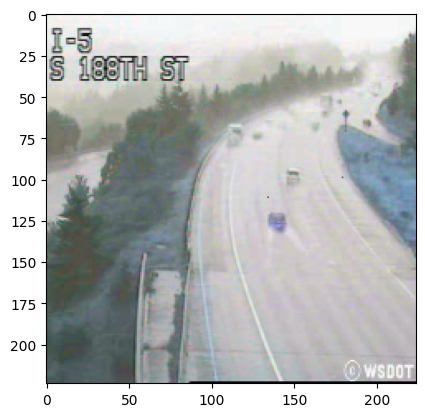

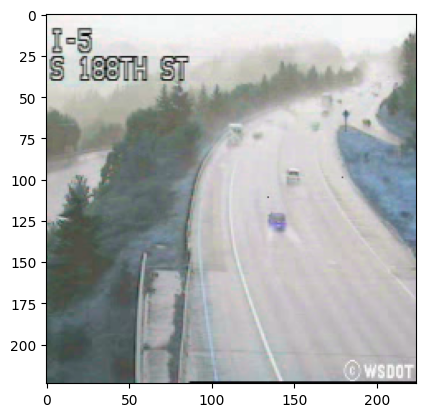

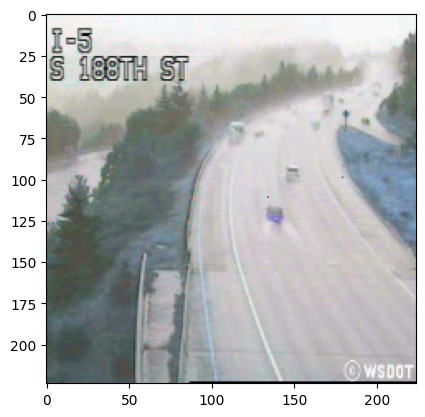

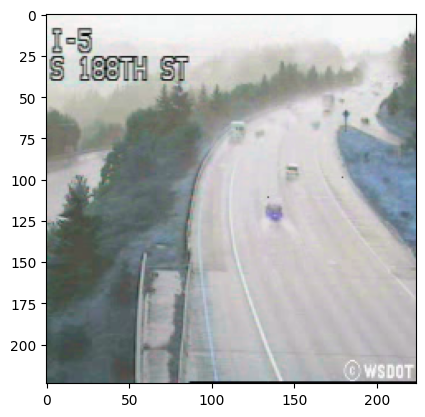

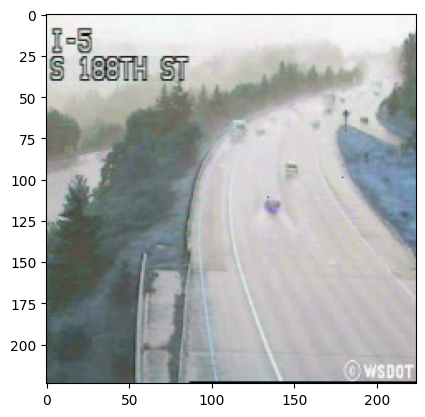

...

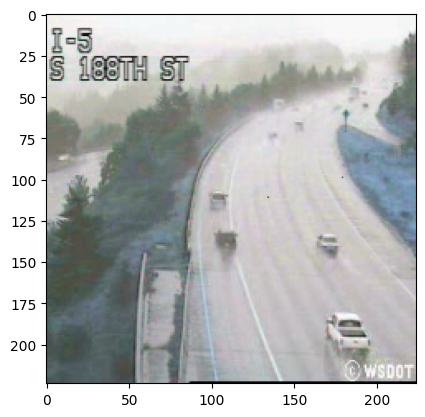

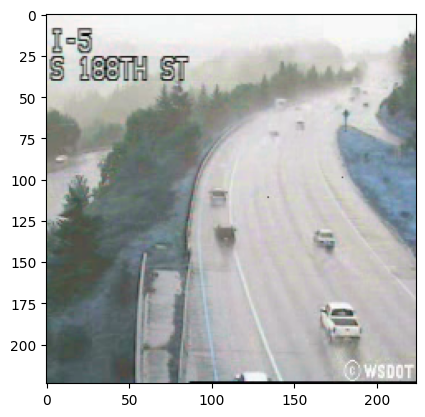

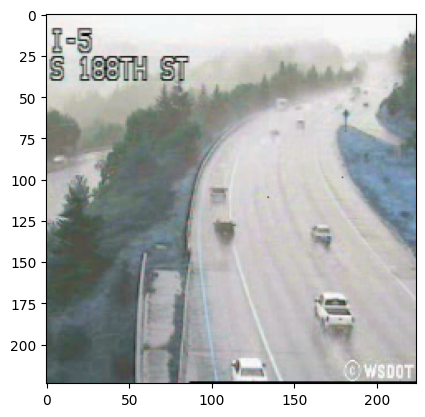

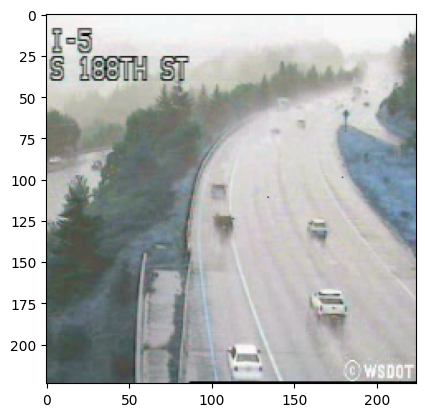

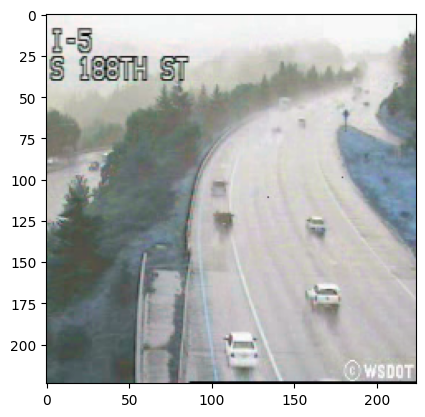

In [ ]:
import matplotlib.pyplot as plt

%matplotlib inline
for i in frames_list:
    for j in i:
        plt.imshow(j)
        plt.show()
    break


In [ ]:
X = np.stack(frames_list[:int(len(frames_list)*0.7)], axis=0)

In [ ]:
print(X.shape)

(177, 40, 224, 224, 3)


In [ ]:
# Create a dictionary to map the labels to integers
label_dict = {'light': 0,
              'medium': 1,
              'heavy': 2}

# Convert the labels to integers using the dictionary
labels_int = [label_dict[label] for label in labels_list]

# One-hot encode the integer labels using NumPy
labels_onehot = np.eye(3)[labels_int]

print(labels_onehot)

[[1. 0. 0.]
 [1. 0. 0.]
 [1. 0. 0.]
 [0. 0. 1.]
 [1. 0. 0.]
 [0. 1. 0.]
 [1. 0. 0.]
 [1. 0. 0.]
 [0. 1. 0.]
 [1. 0. 0.]
 [1. 0. 0.]
 [0. 1. 0.]
 [0. 1. 0.]
 [1. 0. 0.]
 [1. 0. 0.]
 [1. 0. 0.]
 [1. 0. 0.]
 [1. 0. 0.]
 [1. 0. 0.]
 [1. 0. 0.]
 [1. 0. 0.]
 [1. 0. 0.]
 [1. 0. 0.]
 [0. 1. 0.]
 [0. 1. 0.]
 [1. 0. 0.]
 [1. 0. 0.]
 [0. 1. 0.]
 [1. 0. 0.]
 [0. 1. 0.]
 [1. 0. 0.]
 [1. 0. 0.]
 [1. 0. 0.]
 [1. 0. 0.]
 [1. 0. 0.]
 [1. 0. 0.]
 [1. 0. 0.]
 [0. 1. 0.]
 [1. 0. 0.]
 [0. 0. 1.]
 [1. 0. 0.]
 [1. 0. 0.]
 [0. 1. 0.]
 [1. 0. 0.]
 [1. 0. 0.]
 [0. 0. 1.]
 [1. 0. 0.]
 [1. 0. 0.]
 [1. 0. 0.]
 [1. 0. 0.]
 [1. 0. 0.]
 [1. 0. 0.]
 [1. 0. 0.]
 [1. 0. 0.]
 [0. 1. 0.]
 [0. 1. 0.]
 [0. 0. 1.]
 [1. 0. 0.]
 [1. 0. 0.]
 [0. 0. 1.]
 [0. 0. 1.]
 [1. 0. 0.]
 [0. 1. 0.]
 [1. 0. 0.]
 [1. 0. 0.]
 [1. 0. 0.]
 [0. 0. 1.]
 [1. 0. 0.]
 [1. 0. 0.]
 [1. 0. 0.]
 [0. 0. 1.]
 [1. 0. 0.]
 [1. 0. 0.]
 [0. 1. 0.]
 [0. 1. 0.]
 [1. 0. 0.]
 [1. 0. 0.]
 [1. 0. 0.]
 [0. 1. 0.]
 [0. 1. 0.]
 [0. 1. 0.]
 [1. 0. 0.]
 [0. 1. 0.]
 [1.

In [ ]:
num_samples = len(labels_list)
train_size = int(num_samples * 0.7)
train_labels = labels_onehot[:train_size]
test_labels = labels_onehot[train_size:]

In [ ]:
print(len(train_labels))

177


In [ ]:
print(X.shape)


(177, 40, 224, 224, 3)


In [ ]:
sample_fraction = 0.1  # Use only 10% of the data
X_sampled = X[:int(X.shape[0] * sample_fraction)]
train_labels_sampled = train_labels[:int(train_labels.shape[0] * sample_fraction)]


In [ ]:
!pip install h2o

In [ ]:
import pandas as pd
import numpy as np
import h2o
from h2o.estimators.deeplearning import H2ODeepLearningEstimator
from sklearn.decomposition import PCA
import gc

# Initialize H2O with limited memory usage
h2o.init(max_mem_size="6G")

# Assuming you've already loaded and processed your data into X and train_labels

# Reduce the dataset size for initial testing
sample_fraction = 0.1  # Use only 10% of the data
X_sampled = X[:int(X.shape[0] * sample_fraction)]
train_labels_sampled = train_labels[:int(train_labels.shape[0] * sample_fraction)]

# Reshape the data
reshaped_X = X_sampled.reshape(X_sampled.shape[0], -1)
print(f"Shape of reshaped data: {reshaped_X.shape}")

# Adjust the number of components for PCA based on the number of samples
n_components = min(reshaped_X.shape[0], 500)
print(f"Using {n_components} components for PCA.")

pca = PCA(n_components=n_components)
X_pca_sampled = pca.fit_transform(reshaped_X)


Checking whether there is an H2O instance running at http://localhost:54321. connected.


H2O_cluster_uptime:,56 mins 50 secs
H2O_cluster_timezone:,Etc/UTC
H2O_data_parsing_timezone:,UTC
H2O_cluster_version:,3.44.0.1
H2O_cluster_version_age:,15 days
H2O_cluster_name:,H2O_from_python_unknownUser_6msfr0
H2O_cluster_total_nodes:,1
H2O_cluster_free_memory:,3.170 Gb
H2O_cluster_total_cores:,2
H2O_cluster_allowed_cores:,2
H2O_cluster_status:,"locked, healthy"


Shape of reshaped data: (17, 6021120)
Using 17 components for PCA.


In [ ]:
# Convert the PCA transformed data to a pandas DataFrame
df_train_pca = pd.DataFrame(X_pca_sampled)
df_train_labels = pd.DataFrame(train_labels_sampled)

# Convert pandas DataFrame to H2O Frame
hf_train = h2o.H2OFrame(df_train_pca)
hf_train_labels = h2o.H2OFrame(df_train_labels)

# Train the model using H2O's Deep Learning Estimator
model = H2ODeepLearningEstimator(seed=42, epochs=5, mini_batch_size=32, reproducible=True)
model.train(x=hf_train.columns, y=hf_train_labels.columns[0], training_frame=hf_train)

Parse progress: |████████████████████████████████████████████████████████████████| (done) 100%
Parse progress: |████████████████████████████████████████████████████████████████| (done) 100%
deeplearning Model Build progress: |█████████████████████████████████████████████| (done) 100%


Model Details
=============
H2ODeepLearningEstimator : Deep Learning
Model Key: DeepLearning_model_python_1698804660718_1


Status of Neuron Layers: predicting 0, regression, gaussian distribution, Quadratic loss, 43,801 weights/biases, 523.3 KB, 85 training samples, mini-batch size 1
    layer    units    type       dropout    l1    l2    mean_rate              rate_rms               momentum    mean_weight             weight_rms           mean_bias               bias_rms
--  -------  -------  ---------  ---------  ----  ----  ---------------------  ---------------------  ----------  ----------------------  -------------------  ----------------------  -----------------------
    1        16       Input      0.0
    2        200      Rectifier  0.0        0.0   0.0   0.005330465412689591   0.0040215495973825455  0.0         0.0018536531073937114   0.09743335843086243  0.4917587615838885      0.007824350148439407
    3        200      Rectifier  0.0        0.0   0.0   0.01758500039507926    0.04832303524017334    0.0         -0.0015669812240338388  0.06958633661270142  0.9966394866785183      0.004641789942979813
    4        1        Linear                0.0   0.0   0.0005963177698140498  0.0025145262479782104  0.0         0.0029799438285954237   0.09377303719520569  -0.0007800757140453129  1.0971281125650402e-154

ModelMetricsRegression: deeplearning
** Reported on train data. **

MSE: 8950076693.057291
RMSE: 94604.84497665694
MAE: 81121.24155960821
RMSLE: NaN
Mean Residual Deviance: 8950076693.057291

Scoring History: 
    timestamp            duration    training_speed    epochs    iterations    samples    training_rmse    training_deviance    training_mae    training_r2
--  -------------------  ----------  ----------------  --------  ------------  ---------  ---------------  -------------------  --------------  -------------
    2023-11-01 03:08:24  0.000 sec                     0         0             0          nan              nan                  nan             nan
    2023-11-01 03:08:24  0.712 sec   92 obs/sec        1         1             17         131071           1.71795e+10          114127          -4.38861
    2023-11-01 03:08:24  1.006 sec   84 obs/sec        2         2             34         142092           2.01901e+10          126190          -5.33294
    2023-11-01 03:08:24  1.150 sec   108 obs/sec       3         3             51         132118           1.74552e+10          117648          -4.4751
    2023-11-01 03:08:25  1.237 sec   130 obs/sec       4         4             68         94604.8          8.95008e+09          81121.2         -1.80733
    2023-11-01 03:08:25  1.342 sec   142 obs/sec       5         5             85         102928           1.05942e+10          92532.2         -2.32302
    2023-11-01 03:08:25  1.379 sec   138 obs/sec       5         5             85         94604.8          8.95008e+09          81121.2         -1.80733

Variable Importances: 
variable    relative_importance    scaled_importance    percentage
----------  ---------------------  -------------------  ------------
9           1                      1                    0.0685638
15          0.983208               0.983208             0.0674125
16          0.937382               0.937382             0.0642705
1           0.9331                 0.9331               0.0639769
3           0.928856               0.928856             0.0636859
13          0.924681               0.924681             0.0633997
5           0.91509                0.91509              0.0627421
10          0.899342               0.899342             0.0616624
11          0.896375               0.896375             0.0614589
4           0.887209               0.887209             0.0608305
7           0.887002               0.887002             0.0608163
2           0.88646                0.88646              0.0607791
14          0.880717               0.880717             0.0603854
8           0.880031               0.880031            